<a href="https://colab.research.google.com/github/macgyver121/DADS7202_hw2/blob/main/Resnet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# List all NVIDIA GPUs as avaialble in this computer (or Colab's session)
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-6aaed31b-ab70-3861-500a-fca91ad50c58)


In [ ]:
import sys
print( f"Python {sys.version}\n" )

import numpy as np
print( f"NumPy {np.__version__}\n" )

import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
print( f"TensorFlow {tf.__version__}" )
print( f"tf.keras.backend.image_data_format() = {tf.keras.backend.image_data_format()}" )

# Count the number of GPUs as detected by tensorflow
gpus = tf.config.list_physical_devices('GPU')
print( f"TensorFlow detected { len(gpus) } GPU(s):" )
for i, gpu in enumerate(gpus):
  print( f".... GPU No. {i}: Name = {gpu.name} , Type = {gpu.device_type}" )

Python 3.7.15 (default, Oct 12 2022, 19:14:55) 
[GCC 7.5.0]

NumPy 1.21.6

TensorFlow 2.9.2
tf.keras.backend.image_data_format() = channels_last
TensorFlow detected 1 GPU(s):
.... GPU No. 0: Name = /physical_device:GPU:0 , Type = GPU


## **** Mount + Import library ****

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import pathlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from tensorflow.keras import Input, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

import tensorflow_hub as hub

from tensorflow.keras import layers
from tensorflow.keras import activations

## **** Import + Prepare Data ****

In [ ]:
data_directory = pathlib.Path('/content/drive/MyDrive/Garbage')
class_names = [item.name for item in data_directory.glob('*')][0:]
class_names.sort()
print(class_names)

['class1', 'class2', 'class3', 'class4']


In [ ]:
class1_dir = '/content/drive/MyDrive/Garbage/class1'
class2_dir = '/content/drive/MyDrive/Garbage/class2'
class3_dir = '/content/drive/MyDrive/Garbage/class3'
class4_dir = '/content/drive/MyDrive/Garbage/class4'
data_dir = '/content/drive/MyDrive/Garbage'

In [ ]:
class1_images = len(os.listdir(class1_dir))
class2_images = len(os.listdir(class2_dir))
class3_images = len(os.listdir(class3_dir))
class4_images = len(os.listdir(class4_dir))

print(f'Number of class1 images: {class1_images}')
print(f'Number of class2 images: {class2_images}')
print(f'Number of class3 images: {class3_images}')
print(f'Number of class4 images: {class4_images}')

Number of class1 images: 200
Number of class2 images: 269
Number of class3 images: 203
Number of class4 images: 195


In [ ]:
np.random.seed(1234)
tf.random.set_seed(5678)

# Defining data generator 
data_gen = ImageDataGenerator(rescale = 1/255., validation_split = 0.3)

train_data = data_gen.flow_from_directory(data_dir, 
                                          target_size = (224, 224), 
                                          batch_size = 700,
                                          subset = 'training',
                                          class_mode = 'binary')
test_data = data_gen.flow_from_directory(data_dir, 
                                        target_size = (224, 224), 
                                        batch_size = 300,
                                        subset = 'validation',
                                        class_mode = 'binary')

Found 609 images belonging to 4 classes.
Found 258 images belonging to 4 classes.


In [ ]:
x_train, y_train = train_data.next()
len(x_train), len(y_train), x_train[0].shape

(609, 609, (224, 224, 3))

In [ ]:
x_test, y_test = test_data.next()
len(x_test), len(y_test), x_test[0].shape

(258, 258, (224, 224, 3))

# Resnet50

## Create the base model from the pre-trained convnets

In [ ]:
resnet50_extractor = tf.keras.applications.resnet50.ResNet50(include_top=True,weights='imagenet')

102967424/102967424 [==============================] - 1s 0us/step


In [ ]:
# delete last layer
from keras.models import Model
resnet50_extractor= Model(inputs=resnet50_extractor.input, outputs=resnet50_extractor.layers[-2].output)

## Feature Extractor

### Freeze the convolutional base

In [ ]:
resnet50_extractor.trainable = False

for i,layer in enumerate(resnet50_extractor.layers):  
    print( f"Layer {i}: name = {layer.name} , trainable = {layer.trainable}" )

Layer 0: name = input_1 , trainable = False
Layer 1: name = conv1_pad , trainable = False
Layer 2: name = conv1_conv , trainable = False
Layer 3: name = conv1_bn , trainable = False
Layer 4: name = conv1_relu , trainable = False
Layer 5: name = pool1_pad , trainable = False
Layer 6: name = pool1_pool , trainable = False
Layer 7: name = conv2_block1_1_conv , trainable = False
Layer 8: name = conv2_block1_1_bn , trainable = False
Layer 9: name = conv2_block1_1_relu , trainable = False
Layer 10: name = conv2_block1_2_conv , trainable = False
Layer 11: name = conv2_block1_2_bn , trainable = False
Layer 12: name = conv2_block1_2_relu , trainable = False
Layer 13: name = conv2_block1_0_conv , trainable = False
Layer 14: name = conv2_block1_3_conv , trainable = False
Layer 15: name = conv2_block1_0_bn , trainable = False
Layer 16: name = conv2_block1_3_bn , trainable = False
Layer 17: name = conv2_block1_add , trainable = False
Layer 18: name = conv2_block1_out , trainable = False
Layer 19: n

### Add a classification head

In [ ]:
x = resnet50_extractor.output

# Add our custom layer(s) to the end of the existing model 

new_outputs = tf.keras.layers.Dense(4, activation="softmax")(x)

# Construct the main model 
model = tf.keras.models.Model(inputs=resnet50_extractor.inputs, outputs=new_outputs)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

Plot Model

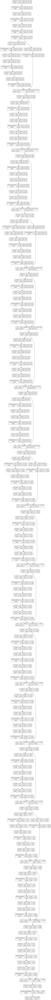

In [ ]:
tf.keras.utils.plot_model(model, to_file='resnet50_original.png', show_shapes=True, show_dtype=True, show_layer_names=False, dpi=96)

### Preprocessing input

In [ ]:
np.random.seed(1234)
tf.random.set_seed(5678)

# Defining data generator withour Data Augmentation
data_gen = ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input, rescale = 1/255., validation_split = 0.3)

train_data = data_gen.flow_from_directory(data_dir, 
                                          target_size = (224, 224), 
                                          batch_size = 700,
                                          subset = 'training',
                                          class_mode = 'binary')
test_data = data_gen.flow_from_directory(data_dir, 
                                        target_size = (224, 224), 
                                        batch_size = 300,
                                        subset = 'validation',
                                        class_mode = 'binary')

Found 609 images belonging to 4 classes.
Found 258 images belonging to 4 classes.


In [ ]:
x_train, y_train = train_data.next()
x_test, y_test = test_data.next()

### Compile the model

In [ ]:
model.compile( loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["acc"] )

### Train the model

In [ ]:
from datetime import datetime
start_time = datetime.now()

np.random.seed(1234)
tf.random.set_seed(5678)

from keras import callbacks

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="weights.hdf5", monitor = 'val_acc', verbose=1, save_best_only=True)

history = model.fit( x_train , y_train, batch_size=10, epochs=30, verbose=1, validation_split=0.3, callbacks=[checkpointer] )
model.load_weights('weights.hdf5')

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

Epoch 1/30
43/43 [==============================] - ETA: 0s - loss: 1.4132 - acc: 0.3263
Epoch 1: val_acc improved from -inf to 0.34426, saving model to weights.hdf5
43/43 [==============================] - 14s 103ms/step - loss: 1.4132 - acc: 0.3263 - val_loss: 1.3283 - val_acc: 0.3443
Epoch 2/30
43/43 [==============================] - ETA: 0s - loss: 1.2815 - acc: 0.4413
Epoch 2: val_acc improved from 0.34426 to 0.44809, saving model to weights.hdf5
43/43 [==============================] - 3s 62ms/step - loss: 1.2815 - acc: 0.4413 - val_loss: 1.2877 - val_acc: 0.4481
Epoch 3/30
43/43 [==============================] - ETA: 0s - loss: 1.2545 - acc: 0.4061
Epoch 3: val_acc did not improve from 0.44809
43/43 [==============================] - 2s 51ms/step - loss: 1.2545 - acc: 0.4061 - val_loss: 1.2621 - val_acc: 0.3770
Epoch 4/30
43/43 [==============================] - ETA: 0s - loss: 1.2061 - acc: 0.4554
Epoch 4: val_acc did not improve from 0.44809
43/43 [==========================

### Learning curves

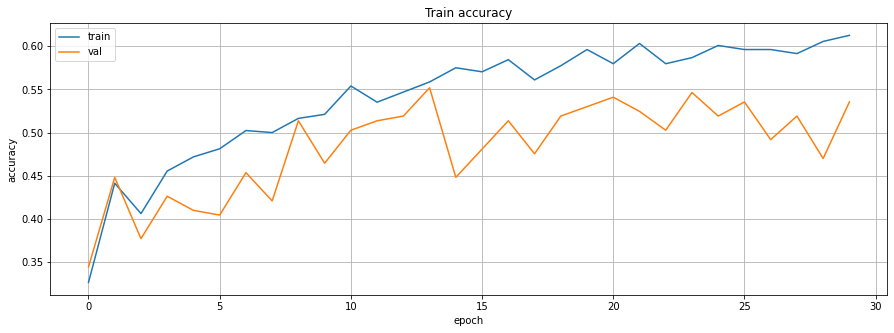

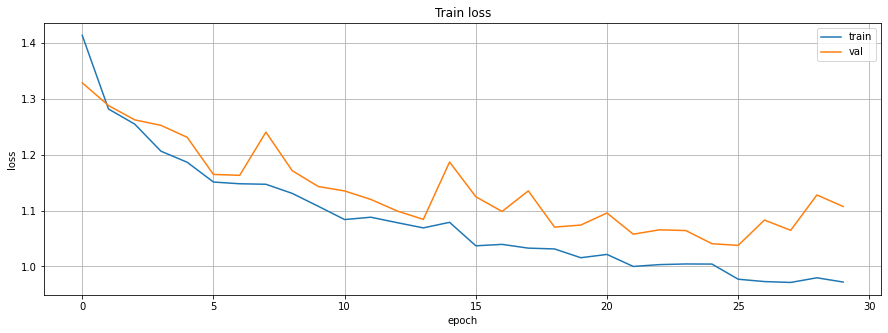

In [ ]:
# Summarize history for accuracy
plt.figure(figsize=(15,5))
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.grid()
plt.show()

# Summarize history for loss
plt.figure(figsize=(15,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.grid()
plt.show()

### Evaluate on test set

In [ ]:
# Evaluate the trained model on the test set
start_time = datetime.now()

results = model.evaluate(x_test, y_test, batch_size=32)
print( f"{model.metrics_names}: {results}" )

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

9/9 [==============================] - 2s 133ms/step - loss: 1.2657 - acc: 0.4419
['loss', 'acc']: [1.265696406364441, 0.44186046719551086]
Duration: 0:00:02.703636


### Evaluate on test set without seed

In [ ]:
# create model
resnet50_extractor = tf.keras.applications.resnet50.ResNet50(weights = "imagenet", include_top=True)
resnet50_extractor= Model(inputs=resnet50_extractor.input, outputs=resnet50_extractor.layers[-2].output)
resnet50_extractor.trainable = False

# add classifier
x = resnet50_extractor.output
new_outputs = tf.keras.layers.Dense(4, activation="softmax")(x)
model = tf.keras.models.Model(inputs=resnet50_extractor.inputs, outputs=new_outputs)

#train model without seed
model.compile( loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["acc"] )

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="weights.hdf5", monitor = 'val_acc', verbose=1, save_best_only=True)
history = model.fit( x_train , y_train, batch_size=10, epochs=30, verbose=1, validation_split=0.3, callbacks=[checkpointer] )
model.load_weights('weights.hdf5')

#Evaluate on test set without seed
start_time = datetime.now()

results = model.evaluate(x_test, y_test, batch_size=32)
print( f"{model.metrics_names}: {results}" )

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

Epoch 1/30
43/43 [==============================] - ETA: 0s - loss: 1.4132 - acc: 0.3263
Epoch 1: val_acc improved from -inf to 0.34426, saving model to weights.hdf5
43/43 [==============================] - 6s 88ms/step - loss: 1.4132 - acc: 0.3263 - val_loss: 1.3283 - val_acc: 0.3443
Epoch 2/30
43/43 [==============================] - ETA: 0s - loss: 1.2815 - acc: 0.4413
Epoch 2: val_acc improved from 0.34426 to 0.44809, saving model to weights.hdf5
43/43 [==============================] - 3s 64ms/step - loss: 1.2815 - acc: 0.4413 - val_loss: 1.2877 - val_acc: 0.4481
Epoch 3/30
43/43 [==============================] - ETA: 0s - loss: 1.2545 - acc: 0.4061
Epoch 3: val_acc did not improve from 0.44809
43/43 [==============================] - 2s 54ms/step - loss: 1.2545 - acc: 0.4061 - val_loss: 1.2621 - val_acc: 0.3770
Epoch 4/30
43/43 [==============================] - ETA: 0s - loss: 1.2061 - acc: 0.4554
Epoch 4: val_acc did not improve from 0.44809
43/43 [============================

ผลการทดลอง 3 ครั่ง
- ครั่งที่ 1 ค่า acc = 0.3643410801887512
- ครั่งที่ 2 ค่า acc = 0.3759689927101135
- ครั้งที่ 3 ค่า acc = 0.44186046719551086
- ค่าเฉลี่ย acc คือ 0.394


## Fine tuning

### Create feature extractor

In [ ]:
img_w,img_h = 224,224
resnet50_extractor = tf.keras.applications.resnet50.ResNet50(include_top=True,weights='imagenet', input_shape = (img_w, img_h, 3))
resnet50_extractor.trainable = False

### Un-freeze the top layers of the model



In [ ]:
resnet50_extractor.layers[-2].trainable = True

### Add a classification head

In [ ]:
x = resnet50_extractor.layers[-2].output

# Add our custom layer(s) to the end of the existing model 
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(8192, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
new_outputs = tf.keras.layers.Dense(4, activation="softmax")(x)

# Construct the main model 
model = tf.keras.models.Model(inputs=resnet50_extractor.inputs, outputs=new_outputs)
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
for i,layer in enumerate(model.layers):  
    print( f"Layer {i}: name = {layer.name} , trainable = {layer.trainable}" )

Layer 0: name = input_3 , trainable = False
Layer 1: name = conv1_pad , trainable = False
Layer 2: name = conv1_conv , trainable = False
Layer 3: name = conv1_bn , trainable = False
Layer 4: name = conv1_relu , trainable = False
Layer 5: name = pool1_pad , trainable = False
Layer 6: name = pool1_pool , trainable = False
Layer 7: name = conv2_block1_1_conv , trainable = False
Layer 8: name = conv2_block1_1_bn , trainable = False
Layer 9: name = conv2_block1_1_relu , trainable = False
Layer 10: name = conv2_block1_2_conv , trainable = False
Layer 11: name = conv2_block1_2_bn , trainable = False
Layer 12: name = conv2_block1_2_relu , trainable = False
Layer 13: name = conv2_block1_0_conv , trainable = False
Layer 14: name = conv2_block1_3_conv , trainable = False
Layer 15: name = conv2_block1_0_bn , trainable = False
Layer 16: name = conv2_block1_3_bn , trainable = False
Layer 17: name = conv2_block1_add , trainable = False
Layer 18: name = conv2_block1_out , trainable = False
Layer 19: n

Model flow

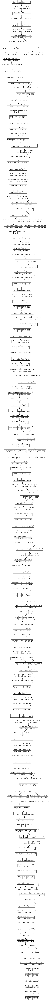

In [ ]:
tf.keras.utils.plot_model(model, to_file='resnet_edit.png', show_shapes=True, show_dtype=True, show_layer_names=False, dpi=96)

### Compile the model

In [ ]:
alpha = 0.001
model.compile( loss="sparse_categorical_crossentropy", optimizer=tf.keras.optimizers.Adamax(learning_rate = alpha) , metrics=["acc"] )

### Train the model

In [ ]:
from datetime import datetime
start_time = datetime.now()

np.random.seed(1234)
tf.random.set_seed(5678)

from keras import callbacks

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="weights.hdf5", monitor = 'val_acc', verbose=1, save_best_only=True)

history = model.fit( x_train , y_train, batch_size=10, epochs=30, verbose=1, validation_split=0.3, callbacks=[checkpointer] )
model.load_weights('weights.hdf5')

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

Epoch 1/30
42/43 [============================>.] - ETA: 0s - loss: 2.2900 - acc: 0.3048
Epoch 1: val_acc improved from -inf to 0.35519, saving model to weights.hdf5
43/43 [==============================] - 8s 122ms/step - loss: 2.2906 - acc: 0.3075 - val_loss: 1.6375 - val_acc: 0.3552
Epoch 2/30
42/43 [============================>.] - ETA: 0s - loss: 1.5783 - acc: 0.2833
Epoch 2: val_acc did not improve from 0.35519
43/43 [==============================] - 2s 58ms/step - loss: 1.5826 - acc: 0.2817 - val_loss: 1.4495 - val_acc: 0.3060
Epoch 3/30
43/43 [==============================] - ETA: 0s - loss: 1.4063 - acc: 0.3615
Epoch 3: val_acc improved from 0.35519 to 0.36066, saving model to weights.hdf5
43/43 [==============================] - 4s 98ms/step - loss: 1.4063 - acc: 0.3615 - val_loss: 1.3020 - val_acc: 0.3607
Epoch 4/30
42/43 [============================>.] - ETA: 0s - loss: 1.2808 - acc: 0.4000
Epoch 4: val_acc improved from 0.36066 to 0.36612, saving model to weights.hdf5


### Learning curves

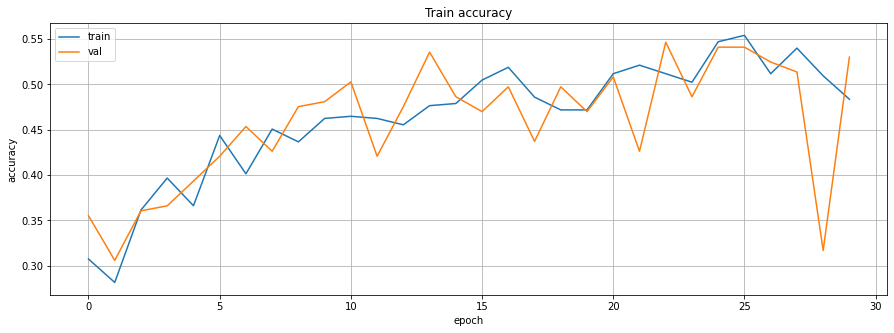

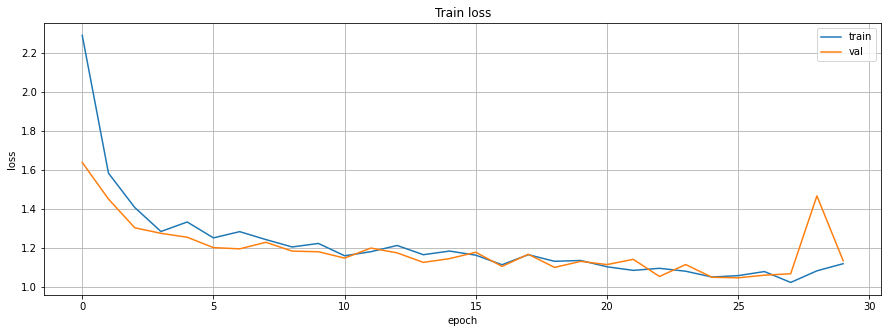

In [ ]:
# Summarize history for accuracy
plt.figure(figsize=(15,5))
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.grid()
plt.show()

# Summarize history for loss
plt.figure(figsize=(15,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.grid()
plt.show()

### Evaluate on test set

In [ ]:
# Evaluate the trained model on the test set
start_time = datetime.now()

results = model.evaluate(x_test, y_test, batch_size=32)
print( f"{model.metrics_names}: {results}" )

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

9/9 [==============================] - 1s 92ms/step - loss: 1.2638 - acc: 0.4612
['loss', 'acc']: [1.2638124227523804, 0.46124032139778137]
Duration: 0:00:01.002251


### Evaluate on test set without seed

In [ ]:
# create model
img_w,img_h = 224,224 
resnet50_extractor = tf.keras.applications.resnet50.ResNet50(weights = "imagenet", include_top=True, input_shape = (img_w, img_h, 3))

x = resnet50_extractor.layers[-2].output

# Add our custom layer(s) to the end of the existing model 
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(8192, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
new_outputs = tf.keras.layers.Dense(4, activation="softmax")(x)

model = tf.keras.models.Model(inputs=resnet50_extractor.inputs, outputs=new_outputs)

#train model without seed
alpha = 0.001
model.compile( loss="sparse_categorical_crossentropy", optimizer=tf.keras.optimizers.Adamax(learning_rate = alpha) , metrics=["acc"] )

start_time = datetime.now()
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="weights.hdf5", monitor = 'val_acc', verbose=1, save_best_only=True)

history = model.fit( x_train , y_train, batch_size=10, epochs=30, verbose=1, validation_split=0.3, callbacks=[checkpointer] )
model.load_weights('weights.hdf5')

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

#Evaluate on test set without seed
start_time = datetime.now()

results = model.evaluate(x_test, y_test, batch_size=32)
print( f"{model.metrics_names}: {results}" )

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

Epoch 1/30
43/43 [==============================] - ETA: 0s - loss: 2.1809 - acc: 0.4789
Epoch 1: val_acc improved from -inf to 0.29508, saving model to weights.hdf5
43/43 [==============================] - 15s 220ms/step - loss: 2.1809 - acc: 0.4789 - val_loss: 57.4402 - val_acc: 0.2951
Epoch 2/30
43/43 [==============================] - ETA: 0s - loss: 0.9517 - acc: 0.6643
Epoch 2: val_acc did not improve from 0.29508
43/43 [==============================] - 6s 143ms/step - loss: 0.9517 - acc: 0.6643 - val_loss: 2.4851 - val_acc: 0.1858
Epoch 3/30
43/43 [==============================] - ETA: 0s - loss: 0.6998 - acc: 0.7582
Epoch 3: val_acc did not improve from 0.29508
43/43 [==============================] - 7s 158ms/step - loss: 0.6998 - acc: 0.7582 - val_loss: 4.4690 - val_acc: 0.1858
Epoch 4/30
43/43 [==============================] - ETA: 0s - loss: 0.4336 - acc: 0.8615
Epoch 4: val_acc did not improve from 0.29508
43/43 [==============================] - 6s 145ms/step - loss: 0

ผลการทดลอง 3 รอบ
- ครั้งที่ 1 acc = 0.7209302186965942
- ครั้งที่ 2 acc = 0.6976743936538696
- ครั่งที่ 3 acc = 0.7093023061752319
- ค่าเฉลี่ย acc ที่ได้คือ 0.7093

## Inference + Prediction

In [ ]:
y_pred = model.predict(x_test)
print(y_pred.shape)

9/9 [==============================] - 2s 97ms/step
(258, 4)


In [ ]:
lst = []
for i in y_pred :
    lst.append(np.argmax(i))

type(np.array(lst))

numpy.ndarray

In [ ]:
y_test[0:10]

array([1., 1., 2., 3., 2., 2., 0., 3., 1., 1.], dtype=float32)

In [ ]:
lst[0:10]

[1, 1, 2, 1, 1, 2, 2, 3, 1, 1]

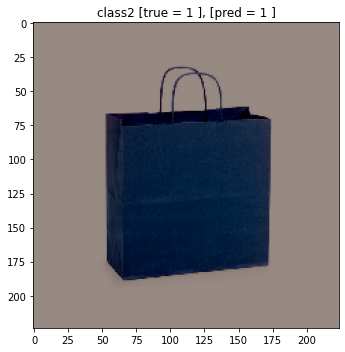

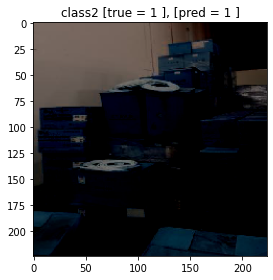

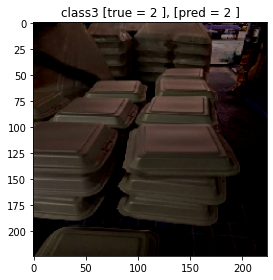

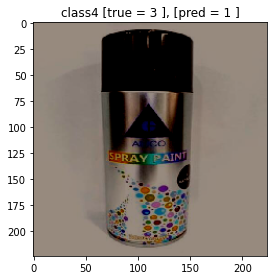

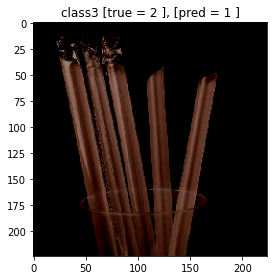

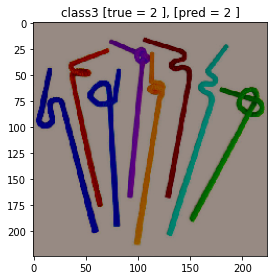

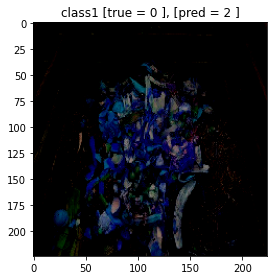

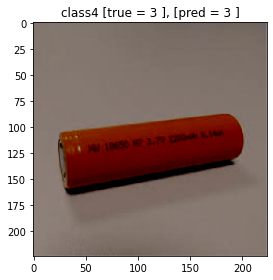

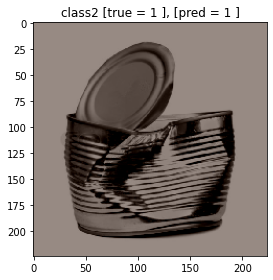

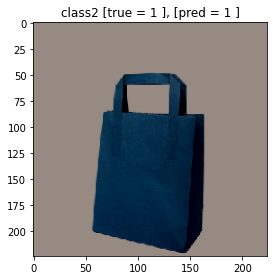

In [ ]:
# Visualize the first five images in test
plt.figure(figsize=(10,5))
for i in range(0,10):
    plt.title( f"{class_names[ int(y_test[i]) ]} [true = {int(y_test[i])} ], [pred = {lst[i]} ]") 
    plt.imshow( x_test[i] )  
    plt.tight_layout()       
    plt.show()

## Check error

In [ ]:
y_test = y_test.astype(int)
df = pd.DataFrame(list(zip(y_test, lst)), columns = ['y_test', 'y_pred'])

In [ ]:
print(df.head())

   y_test  y_pred
0       1       1
1       1       1
2       2       2
3       3       1
4       2       1


In [ ]:
index_list = df[df['y_test'] != df['y_pred']].index

In [ ]:
index_list

Int64Index([  3,   4,   6,  10,  13,  14,  16,  20,  26,  41,  45,  46,  48,
             54,  55,  56,  58,  59,  61,  66,  71,  74,  77,  85,  86,  98,
            101, 102, 107, 108, 115, 117, 119, 138, 141, 142, 147, 149, 150,
            157, 159, 160, 161, 172, 173, 183, 184, 186, 187, 190, 192, 195,
            196, 198, 199, 203, 206, 207, 209, 211, 218, 220, 223, 230, 232,
            233, 235, 236, 240, 241, 243, 245, 247, 248, 249, 251, 253],
           dtype='int64')

In [ ]:
len(index_list)

77

In [ ]:
df.iloc[index_list]

,y_test,y_pred
3,3,1
4,2,1
6,0,2
10,3,2
13,1,2
...,...,...
247,3,1
248,0,2
249,3,2
251,2,3


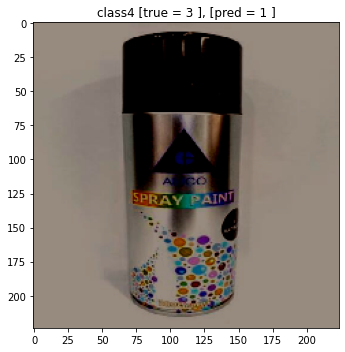

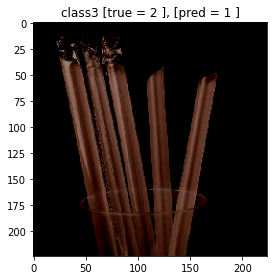

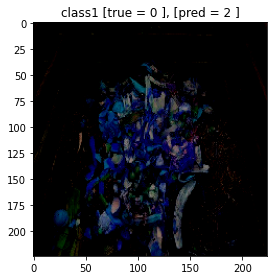

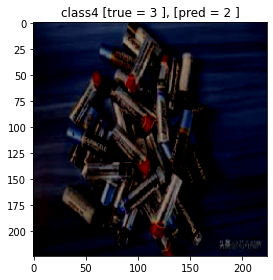

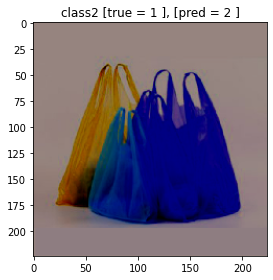

...

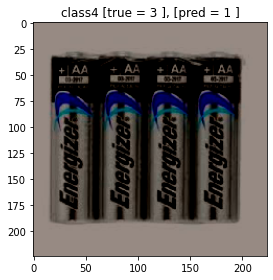

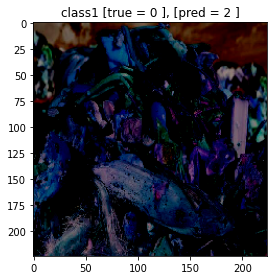

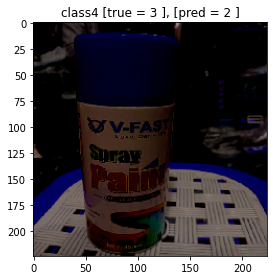

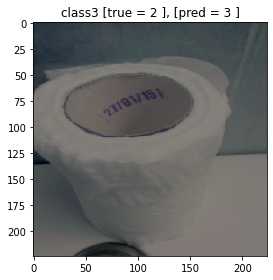

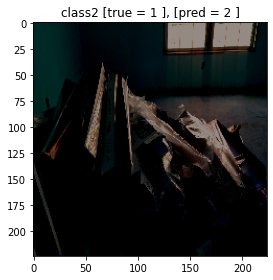

In [ ]:
# Visualize the first five images in test
plt.figure(figsize=(10,5))
for i in index_list:
    plt.title( f"{class_names[ int(y_test[i]) ]} [true = {int(y_test[i])} ], [pred = {lst[i]} ]") 
    plt.imshow( x_test[i] )  
    plt.tight_layout()       
    plt.show()